In [1]:
import pandas as pd
import numpy as np
import os
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_plotly
from prophet.plot import add_changepoints_to_plot
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import itertools


In [2]:
df = pd.read_csv('Data/nyc_energy_consumption.csv')
df.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


In [3]:
df.tail()

,timeStamp,demand,precip,temp
49200,2017-08-12 02:00:00,NaN,0.0000,70.84
49201,2017-08-12 03:00:00,NaN,0.0000,70.57
49202,2017-08-12 04:00:00,NaN,0.0000,69.89
49203,2017-08-12 05:00:00,NaN,0.0000,68.59
49204,2017-08-12 06:00:00,NaN,0.0031,67.33


In [4]:
df.shape

(49205, 4)

In [5]:
numeric_data = df.select_dtypes(include=[np.number])
cat_data = df.select_dtypes(exclude=[np.number])
print ("There are {} numeric and {} Non Numerical columns in the data".format(numeric_data.shape[1],cat_data.shape[1]))
print ("The duration of train data is from {} to {} ".format(df.timeStamp.min(),df.timeStamp.max()))

There are 3 numeric and 1 Non Numerical columns in the data
The duration of train data is from 2012-01-01 00:00:00 to 2017-08-12 06:00:00 


In [6]:
#checking for duplicates
def duplicate_data(data):
  dup_df = data[data.duplicated()]
  if dup_df.shape[0]==0:
    print("No duplicate data found in this dataset")
  else:
    print("Duplicate data found in this dataset.")
    data.drop_duplicates(keep='first', inplace=True)
    print("Duplicate data deleted from this dataset.")
duplicate_data(df)

No duplicate data found in this dataset


In [7]:
#Checking for Missing Datas
def miss_data(data):
  if data.isnull().values.any()==False:
    return print('No missing value found for this dataset')
  else:
    col_name = data.columns[data.isnull().any()].tolist()
    return print('Column named {} have missing values'.format(', '.join(col_name)))
miss_data(df)

Column named demand, precip, temp have missing values


In [8]:
df['timeStamp'] = pd.to_datetime(df['timeStamp'])
df['timeStamp']

0       2012-01-01 00:00:00
1       2012-01-01 01:00:00
2       2012-01-01 02:00:00
3       2012-01-01 03:00:00
4       2012-01-01 04:00:00
                ...        
49200   2017-08-12 02:00:00
49201   2017-08-12 03:00:00
49202   2017-08-12 04:00:00
49203   2017-08-12 05:00:00
49204   2017-08-12 06:00:00
Name: timeStamp, Length: 49205, dtype: datetime64[ns]

In [9]:
#Line plot of energy demand over time.
import plotly.express as px
fig_energy = px.line(df, x='timeStamp', y='demand', title='Energy Demand Per Hour (New York)')
fig_energy.update_xaxes(rangeslider_visible=True)
fig_energy.show()

In [10]:
#Line Plot of temprature over time.
fig_temp = px.line(df, x='timeStamp', y='temp', title='Temperature Per Hour (New York)')
fig_temp.update_xaxes(rangeslider_visible=True)
fig_temp.show()



# Resampling hourly data to Daily Data. Our data has a lot of data points due to the hourly records.To simplify let's  take the average of the hourly data to provide a daily value using the .resample('D').mean() method.

In [11]:
df = df.set_index('timeStamp')
df_max = df[['demand', 'temp']].resample('D').max()
df_min = df[['demand', 'temp']].resample('D').min()
df = df[['demand', 'temp']].resample('D').mean()


In [12]:
miss_data(df)
df[df.temp.isnull()]


Column named demand, temp have missing values


,demand,temp
timeStamp,,
2015-12-28,5510.776333,NaN


In [13]:

#Forward filing  to fill the  missing values  with the last observed non-missing value in the column.
df['temp'] = df['temp'].fillna(method='ffill')
df[df.demand.isnull()]


,demand,temp
timeStamp,,
2017-08-11,NaN,72.767917
2017-08-12,NaN,69.771429


In [14]:
df = df.dropna()
df.head()

,demand,temp
timeStamp,,
2012-01-01,4954.833333,46.510000
2012-01-02,5302.954167,40.496667
2012-01-03,6095.512500,26.672500
2012-01-04,6336.266667,20.585000
2012-01-05,6130.245833,33.577500


In [15]:
fig_daily_energy = px.line(df, x=df.index, y='demand',title='Daily Avg Energy Demand per Hour(NewYork)')
fig_daily_energy.update_xaxes(rangeslider_visible=True)
fig_daily_energy.show()

In [16]:
fig_daily_temp = px.line(df, x=df.index, y='temp',title='Daily Avg temperature per Hour(NewYork)')
fig_daily_temp.update_xaxes(rangeslider_visible=True)
fig_daily_temp.show()

# Forecasting with Facebook Prophet
## Data preparation(Univariate time series model)

Prophet requires input as a dataframe with two columns:

Renaming columns timeStamp and demand, respectively, as **ds : datetime column** and 
**y: numeric column which represents the measurement we wish to forecast.**.

Prophet uses this input format to perform time series forecasting tasks.

In [17]:
df_daily_uni=df.reset_index()[['timeStamp','demand']].rename({'timeStamp':'ds','demand':'y'}, axis='columns')
df_daily_uni.head()

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


## Train Test split:

For training purposes, using data up to May 31, 2017.
The last 71 days are preserved for testing.

In [18]:
    train_df=df_daily_uni[(df_daily_uni['ds'] >= '2012-01-01') & (df_daily_uni['ds'] <= '2017-05-31')]
test_df=df_daily_uni[(df_daily_uni['ds'] > '2017-05-31')]

In [19]:
#creatoing  a forecasting model (model_1) and training the model
 # Also considering the Patterns and fluctuations that occur on an annual basis
model_1 = Prophet(interval_width=0.95,yearly_seasonality=True)
model_1.fit(train_df)

22:53:04 - cmdstanpy - INFO - Chain [1] start processing
22:53:04 - cmdstanpy - INFO - Chain [1] done processing


In [20]:
#Generating a DataFrame with future dates that extend beyond the dates present in the training data.
#This allows us to make forecasts for these future dates using the trained Prophet model.
future_df = model_1.make_future_dataframe(periods=test_df.shape[0])
future_df.head()

,ds
0,2012-01-01
1,2012-01-02
2,2012-01-03
3,2012-01-04
4,2012-01-05


In [21]:
future_df.tail()

,ds
2044,2017-08-06
2045,2017-08-07
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10


In [22]:
#Making predictions//Forecasting

In [23]:
#'ds': The dates for which the forecasts were made.
#'yhat': The predicted values (forecast).
#'yhat_lower': The lower bound of the forecasted values (uncertainty interval).
#'yhat_upper': The upper bound of the forecasted values (uncertainty interval)
    
forecast_df = model_1.predict(future_df)
forecast_df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()
forecast_df.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-01-01,6021.427845,4203.509269,5966.295361,6021.427845,6021.427845,-928.115659,-928.115659,-928.115659,-542.983855,-542.983855,-542.983855,-385.131805,-385.131805,-385.131805,0.0,0.0,0.0,5093.312185
1,2012-01-02,6021.949066,4811.508512,6670.073362,6021.949066,6021.949066,-247.784813,-247.784813,-247.784813,128.457264,128.457264,128.457264,-376.242077,-376.242077,-376.242077,0.0,0.0,0.0,5774.164253
2,2012-01-03,6022.470288,4957.168143,6777.629961,6022.470288,6022.470288,-129.399750,-129.399750,-129.399750,237.207200,237.207200,237.207200,-366.606950,-366.606950,-366.606950,0.0,0.0,0.0,5893.070538
3,2012-01-04,6022.991509,5030.007959,6821.576616,6022.991509,6022.991509,-119.971956,-119.971956,-119.971956,236.322232,236.322232,236.322232,-356.294189,-356.294189,-356.294189,0.0,0.0,0.0,5903.019553
4,2012-01-05,6023.512731,4935.237370,6859.429384,6023.512731,6023.512731,-143.804401,-143.804401,-143.804401,201.577534,201.577534,201.577534,-345.381935,-345.381935,-345.381935,0.0,0.0,0.0,5879.708330


In [24]:
forecast_df['yhat']

0       5093.312185
1       5774.164253
2       5893.070538
3       5903.019553
4       5879.708330
           ...     
2044    6792.773965
2045    7449.149914
2046    7546.079490
2047    7536.628713
2048    7496.512080
Name: yhat, Length: 2049, dtype: float64

In [25]:
df_daily_uni

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833
...,...,...
2044,2017-08-06,5702.361542
2045,2017-08-07,6398.154167
2046,2017-08-08,6471.626042
2047,2017-08-09,6811.112167


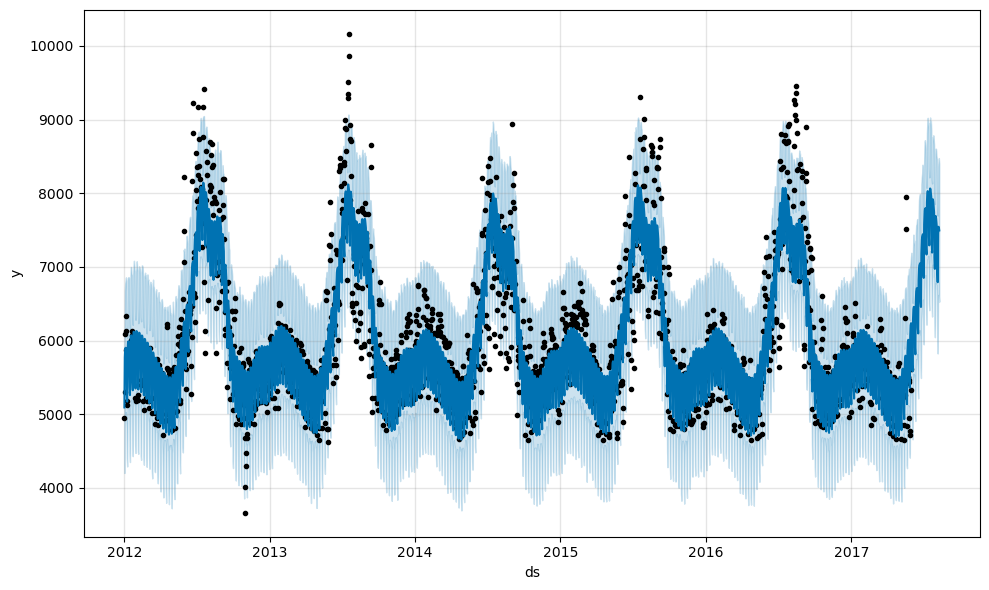

In [26]:
#generating a plot of the forecasted values along with the historical data.
plot_fig_1 = model_1.plot(forecast_df)

In [27]:
#In the forecast plot below, deep blue line is forecasted demand 'y_hat', black dots are actual demand 'y'.
#The light blue shade is 95% confidence interval around the forecast. 
#The uncertainty interval in this region is bounded by 'yhat_lower' and 'yhat_upper' values.

plot_fig_2 = plot_plotly(model_1, forecast_df)  
py.iplot(plot_fig_2)

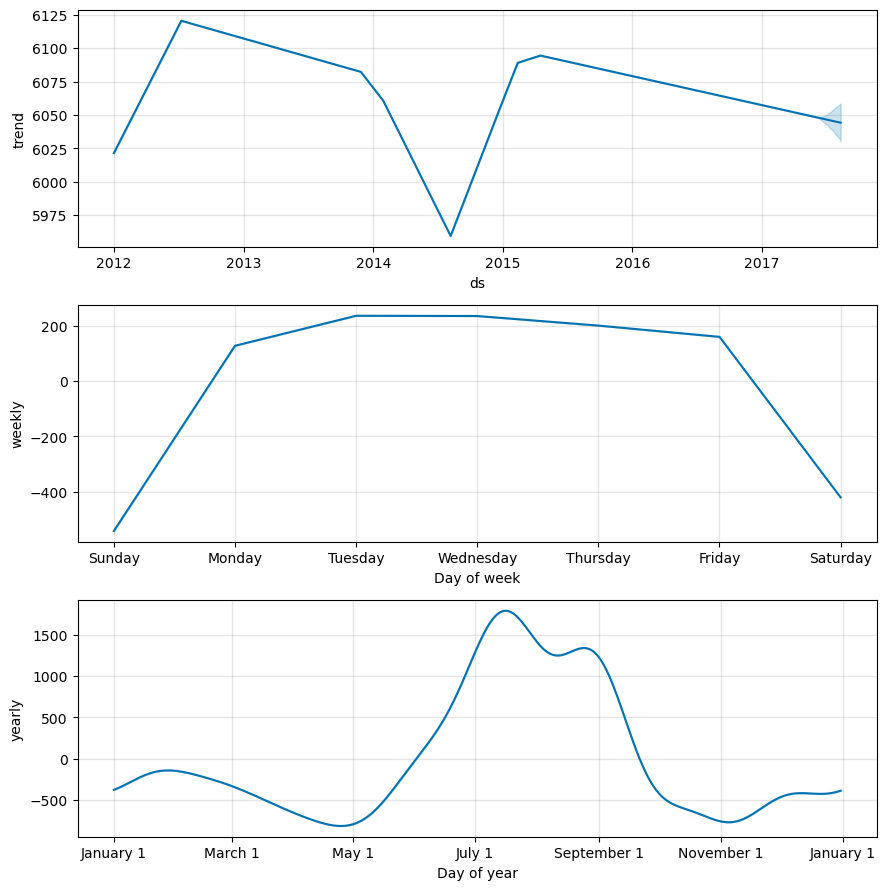

In [28]:
#visualizing the individual components of the forecasted data and ploting the trend,
#yearly seasonality, and weekly seasonality components separately.

plot_fig_3 = model_1.plot_components(forecast_df)

# Analysis:
We can observe the following on forecast components plotted above:

Trend component:

There's upward trend upto mid of 2012 and then a downward trend upto mid of 2014 and then again there is an upward trend upto March,2015.Since then we observed slightly downward trend.

Weekly seasonality component:

The weekly seasonality shows that people uses more electricity on weekdays. In particular, we observe a increase on demand from Sunday to Monday. This might point to a weekend effect.

Yearly seasonality component:

From May to September the demand is pretty high and the reason is the summer months otherwise in January to March or April around the time frame the demand is lower as those are winter months.

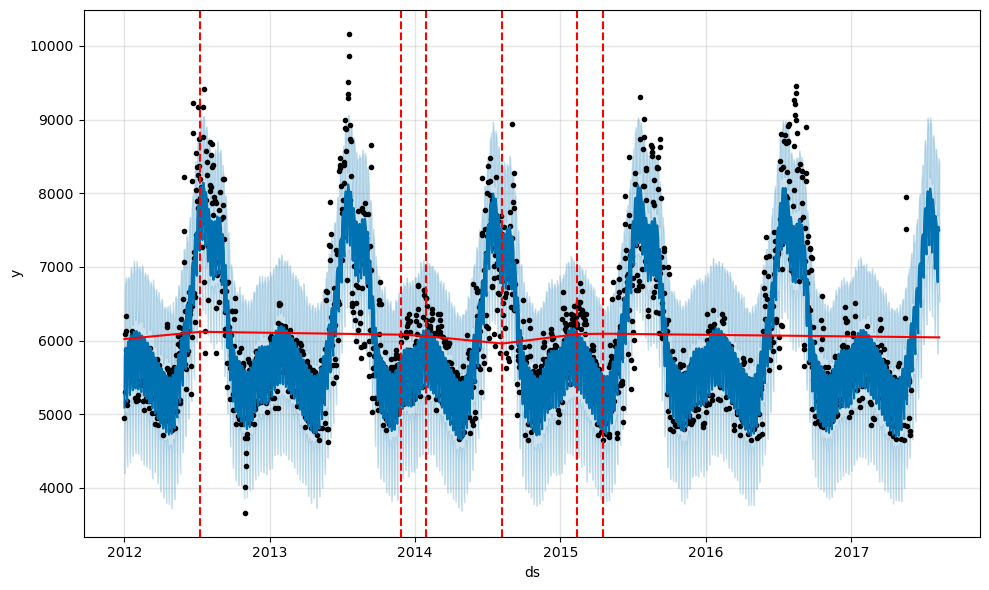

In [29]:
#Changepoints are points in time where the rate of change in the underlying trend of the data changes abruptly.

#In the plot below, the dotted lines represent the changepoints for the given time series.
plot_fig_1 = model_1.plot(forecast_df)
plot_fig_4 = add_changepoints_to_plot(plot_fig_1.gca(), model_1, forecast_df)

In [30]:
#setting up lists to store the Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE) for multiple models. 
all_model_MAE=[]
all_model_MAPE=[]

In [31]:

eval_df = pd.merge(train_df, forecast_df,on='ds')
eval_df  = eval_df[['ds','yhat_lower','yhat_upper','yhat','y']]
eval_df.head()

,ds,yhat_lower,yhat_upper,yhat,y
0,2012-01-01,4203.509269,5966.295361,5093.312185,4954.833333
1,2012-01-02,4811.508512,6670.073362,5774.164253,5302.954167
2,2012-01-03,4957.168143,6777.629961,5893.070538,6095.512500
3,2012-01-04,5030.007959,6821.576616,5903.019553,6336.266667
4,2012-01-05,4935.237370,6859.429384,5879.708330,6130.245833


In [32]:
# calculate MAE between observed and predicted values 
y_true = eval_df['y'].values
y_pred = eval_df['yhat'].values
mae_model_1 = mean_absolute_error(y_true, y_pred)
all_model_MAE.append(mae_model_1)
print('MAE: %.3f' % mae_model_1)

MAE: 321.078


In [33]:
mape_model_1 = mean_absolute_percentage_error(y_true, y_pred)
all_model_MAPE.append(mape_model_1)
print('MAPE: %.3f' % mape_model_1)

MAPE: 0.051


In [34]:
#The forecasted values from the model, on average, deviate from the actual values by approximately 5.1% of the actual values.
#This shows there is good accuracy in predicting the target variable.
#However, we should be wondering to make a better model so as to get more accurate values. 

In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=eval_df['ds'], y=eval_df['y'],
                    mode='lines',
                    name='Actual'))
fig.add_trace(go.Scatter(x=eval_df['ds'], y=eval_df['yhat'],
                    mode='lines+markers',
                    name='Predicted'))

# Fine tuning hyperparameters


We can apply grid search and try to fine tune the hyperparameters. Let's apply it and try to find hyperparameters that may give us lower MAPE.

Here we try different values of changepoint_prior_scale and seasonality_prior_scale. changepoint_prior_scale determines the flexibility of the trend, and in particular how much the trend changes at the trend changepoints.While seasonality_prior_scale controls the flexibility of the seasonality.

In [36]:
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1,0.005,0.05, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],   
} #defines a grid of hyperparameters to be tuned.

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
maes = []  # Store the MAE for each params here
mapes = [] # Store the MAPE for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(interval_width=0.95,yearly_seasonality=True,**params)
    m.fit(train_df)  # Fit model with given params
    df_cv = cross_validation(m, horizon='71 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    maes.append(df_p['mae'].values[0])
    mapes.append(df_p['mape'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['mae'] = maes
tuning_results['mape'] = mapes

22:53:07 - cmdstanpy - INFO - Chain [1] start processing
22:53:07 - cmdstanpy - INFO - Chain [1] done processing
22:53:15 - cmdstanpy - INFO - Chain [1] start processing
22:53:15 - cmdstanpy - INFO - Chain [1] done processing
22:53:23 - cmdstanpy - INFO - Chain [1] start processing
22:53:23 - cmdstanpy - INFO - Chain [1] done processing
22:53:30 - cmdstanpy - INFO - Chain [1] start processing
22:53:31 - cmdstanpy - INFO - Chain [1] done processing
22:53:38 - cmdstanpy - INFO - Chain [1] start processing
22:53:38 - cmdstanpy - INFO - Chain [1] done processing
22:53:46 - cmdstanpy - INFO - Chain [1] start processing
22:53:46 - cmdstanpy - INFO - Chain [1] done processing
22:53:53 - cmdstanpy - INFO - Chain [1] start processing
22:53:53 - cmdstanpy - INFO - Chain [1] done processing
22:54:01 - cmdstanpy - INFO - Chain [1] start processing
22:54:01 - cmdstanpy - INFO - Chain [1] done processing
22:54:08 - cmdstanpy - INFO - Chain [1] start processing
22:54:08 - cmdstanpy - INFO - Chain [1]

In [37]:
tuning_hp_df = pd.DataFrame(tuning_results)
tuning_hp_df.sort_values(['mape','mae'])

,changepoint_prior_scale,seasonality_prior_scale,mae,mape
12,0.005,0.01,374.821081,0.059480
4,0.010,0.01,380.941858,0.060442
13,0.005,0.10,380.582210,0.060454
14,0.005,1.00,382.565575,0.060797
15,0.005,10.00,383.810823,0.061026
7,0.010,10.00,391.249530,0.062317
5,0.010,0.10,391.996839,0.062469
6,0.010,1.00,392.585006,0.062569
0,0.001,0.01,394.055114,0.063241
1,0.001,0.10,400.878247,0.064404


In [38]:
best_params = all_params[np.argmin(mapes)]
print(best_params)

{'changepoint_prior_scale': 0.005, 'seasonality_prior_scale': 0.01}


# Initializing a new Prophet model (model_2) with the hyperparameters that resulted in the lowest Mean Absolute Percentage Error (MAPE)  of the value found during the hyperparameter tuning process. 

In [39]:
model_2 = Prophet(interval_width=0.95, yearly_seasonality=True, 
            changepoint_prior_scale=best_params['changepoint_prior_scale'], 
            seasonality_prior_scale=best_params['seasonality_prior_scale'])
model_2 = model_2.fit(train_df)

22:56:43 - cmdstanpy - INFO - Chain [1] start processing
22:56:43 - cmdstanpy - INFO - Chain [1] done processing


In [40]:
forecast_df_2 = model_2.predict(future_df)

In [41]:
plot_fig_5 = plot_plotly(model_2, forecast_df_2)  
py.iplot(plot_fig_5)

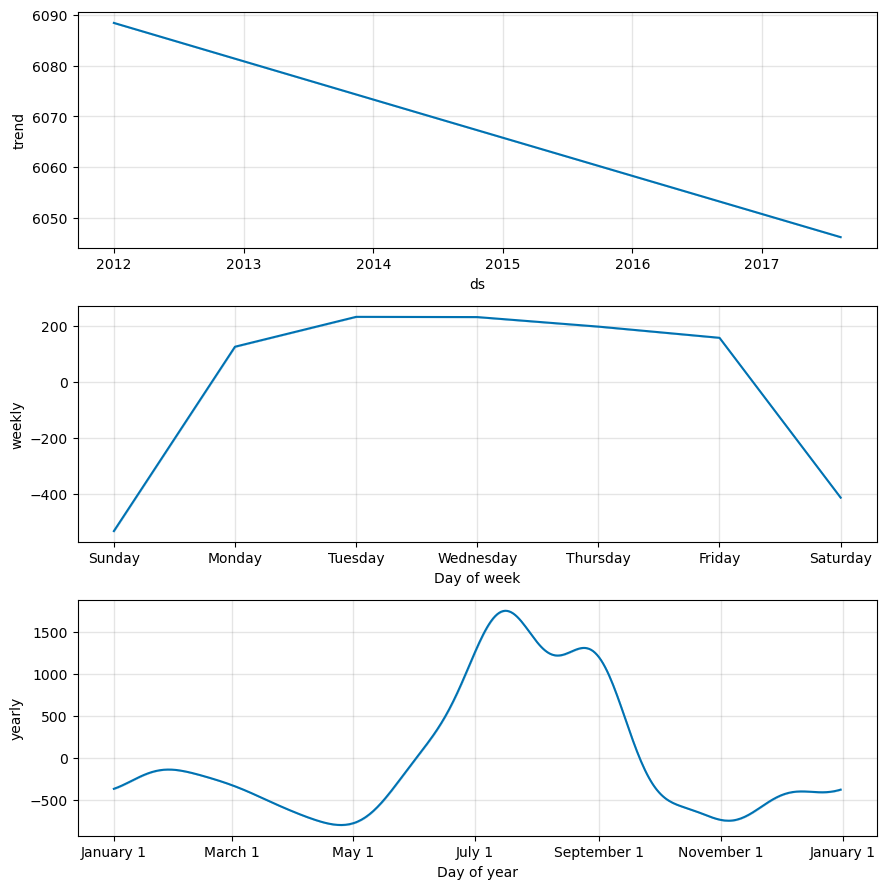

In [42]:
plot_fig_6 = model_2.plot_components(forecast_df_2)

In [43]:
eval_df_2 = pd.merge(train_df, forecast_df_2,on='ds')
eval_df_2  = eval_df_2[['ds','yhat_lower','yhat_upper','yhat','y']]
eval_df_2.head()

,ds,yhat_lower,yhat_upper,yhat,y
0,2012-01-01,4177.500230,6140.297889,5181.604865,4954.833333
1,2012-01-02,4912.793460,6761.560746,5846.681742,5302.954167
2,2012-01-03,5062.349862,6889.215459,5961.902108,6095.512500
3,2012-01-04,5060.385857,6874.958388,5970.535771,6336.266667
4,2012-01-05,5099.288541,6862.174745,5946.647423,6130.245833


In [44]:
y_true = eval_df_2['y'].values
y_pred = eval_df_2['yhat'].values
mae_model_2 = mean_absolute_error(y_true, y_pred)
all_model_MAE.append(mae_model_2)
print('MAE: %.3f' % mae_model_2)

MAE: 323.002


In [45]:
mape_model_2 = mean_absolute_percentage_error(y_true, y_pred)
all_model_MAPE.append(mape_model_2)
print('MAPE: %.3f' % mape_model_2)

MAPE: 0.051


We did not achieve good results after hyperparameter tuning.
It seems our previous model did better without hyperparameter tuning.
We will try to improve our model using Multivariate analysis.
For this, we will consider temperature as it may play a key role to improve our model's performance. 

In [46]:
#preparing a DataFrame for multi-variate time series analysis.
df_daily_multi=df.reset_index()[['timeStamp','demand','temp']].rename({'timeStamp':'ds','demand':'y'}, axis='columns')
df_daily_multi['Month'] = df_daily_multi.ds.dt.month
df_daily_multi = df_daily_multi.dropna()
df_daily_multi.head()

,ds,y,temp,Month
0,2012-01-01,4954.833333,46.510000,1
1,2012-01-02,5302.954167,40.496667,1
2,2012-01-03,6095.512500,26.672500,1
3,2012-01-04,6336.266667,20.585000,1
4,2012-01-05,6130.245833,33.577500,1


In [47]:
df_daily_multi.tail()

,ds,y,temp,Month
2044,2017-08-06,5702.361542,70.129167,8
2045,2017-08-07,6398.154167,68.203750,8
2046,2017-08-08,6471.626042,71.039167,8
2047,2017-08-09,6811.112167,73.852500,8
2048,2017-08-10,5582.297000,75.217500,8


In [48]:
df_max['temp']=df_max['temp'].fillna(method='ffill')
df_min['temp']=df_min['temp'].fillna(method='ffill')
df_max_mul=df_max.reset_index()[['timeStamp','temp']].rename({'timeStamp':'ds','temp':'max_temp'}, axis='columns')
df_min_mul=df_min.reset_index()[['timeStamp','temp']].rename({'timeStamp':'ds','temp':'min_temp'}, axis='columns')
#processing temperature data to create DataFrames containing the maximum and minimum temperature values for each day,
#which can be used for multi-variate time series analysis alongside other data.

In [49]:
eval_df_2['error']=abs(eval_df_2['y']-eval_df_2['yhat'])
eval_df_2= pd.merge(pd.merge(pd.merge(eval_df_2, df_max_mul, on='ds'),df_daily_multi[['ds','temp']],on='ds'),df_min_mul[['ds','min_temp']],on='ds')
eval_df_2.sort_values('error',ascending=False)

,ds,yhat_lower,yhat_upper,yhat,y,error,max_temp,temp,min_temp
1687,2016-08-14,5801.764790,7642.364457,6748.066251,8989.980375,2241.914124,93.67,86.650000,80.96
1686,2016-08-13,5956.811280,7856.182763,6861.390329,9067.921292,2206.530963,94.86,87.426250,80.29
172,2012-06-21,6069.545115,7839.647630,7015.440758,9219.370833,2203.930076,93.39,86.916667,75.33
565,2013-07-19,7099.834876,8771.972669,7963.550522,10163.279167,2199.728645,95.78,89.606667,83.23
1965,2017-05-19,4875.856643,6688.890873,5783.026422,7950.161333,2167.134911,91.27,81.322500,68.84
...,...,...,...,...,...,...,...,...,...
837,2014-04-17,4592.962216,6367.754370,5495.196000,5494.545833,0.650166,45.34,40.967917,36.86
1393,2015-10-25,3905.675282,5784.672939,4845.803157,4845.391250,0.411907,65.47,58.480000,51.45
475,2013-04-20,3940.504364,5807.316901,4876.876044,4877.262500,0.386456,62.42,53.967500,49.80
501,2013-05-16,4846.526627,6688.408146,5767.116386,5767.362500,0.246114,76.33,69.157083,62.66


This model did comparatively well when the temperature was not so high. The opposite thing was observed when the temperature was high enough.Let's check the correlation plot to understand it better.


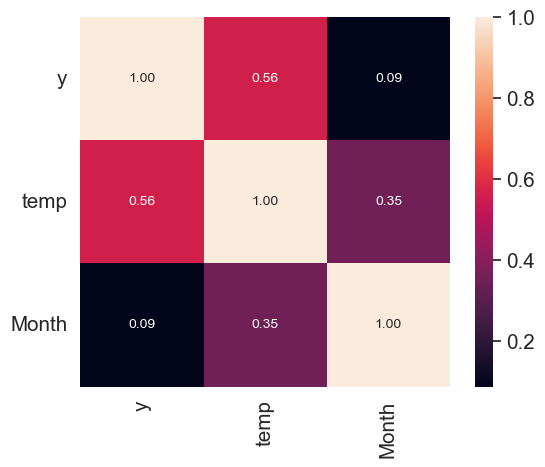

In [50]:
# Drop non-numeric columns and reset index
df_daily_multi_reset = df_daily_multi.select_dtypes(include=[np.number]).reset_index(drop=True)

# Calculate correlation matrix
corrmat = df_daily_multi_reset.corr()

# Select the top correlated variables with the target variable 'y'
cols = corrmat.nlargest(7, 'y')['y'].index

# Calculate the correlation matrix for the selected variables
cm = np.corrcoef(df_daily_multi_reset[cols].values.T)

# Create the heatmap
sns.set(font_scale=1.35)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)

# Set plot settings and display the heatmap
plt.yticks(rotation=0)
plt.xticks(rotation=90)
sns.set(rc={'figure.figsize':(10,8)})
plt.show()


# This concludes that the temperature has a good correlation with the target variable.

In [51]:
df_daily_multi = pd.merge(pd.merge(df_daily_multi, df_max_mul, on='ds'), df_min_mul[['ds','min_temp']], on='ds')
df_daily_multi.query('temp > 55')[['y','temp']].corr()


,y,temp
y,1.000000,0.879896
temp,0.879896,1.000000


In [52]:
df_daily_multi.query('max_temp >60')[['y','max_temp']].corr()

,y,max_temp
y,1.0000,0.8305
max_temp,0.8305,1.0000


In [53]:
df_daily_multi.query('min_temp >50')[['y','min_temp']].corr()

,y,min_temp
y,1.000000,0.876557
min_temp,0.876557,1.000000


# We observed strong correlation with target variable for: 

i) **temp** above 55

ii) **max_temp** above 60

iii) **min_temp** above 50

We will try to create new features based on this relationship.We will also try to create a new feature based on month.

In [54]:
def summer_temp(temp):
  if temp > 55:
    return 1
  else:
    return 0

def summer_temp_min(min_temp):
  if min_temp > 50:
    return 1
  else:
    return 0    

def summer_temp_max(max_temp):
  if max_temp > 60:
    return 1
  else:
    return 0   


df_daily_multi['summer_temp']=df_daily_multi['temp'].apply(summer_temp)    

df_daily_multi['summer_temp_min']=df_daily_multi['min_temp'].apply(summer_temp_min)    

df_daily_multi['summer_temp_max']=df_daily_multi['max_temp'].apply(summer_temp_max)    
df_daily_multi

,ds,y,temp,Month,max_temp,min_temp,summer_temp,summer_temp_min,summer_temp_max
0,2012-01-01,4954.833333,46.510000,1,50.77,38.78,0,0,0
1,2012-01-02,5302.954167,40.496667,1,49.78,33.57,0,0,0
2,2012-01-03,6095.512500,26.672500,1,33.14,16.47,0,0,0
3,2012-01-04,6336.266667,20.585000,1,31.83,13.40,0,0,0
4,2012-01-05,6130.245833,33.577500,1,39.16,27.31,0,0,0
...,...,...,...,...,...,...,...,...,...
2044,2017-08-06,5702.361542,70.129167,8,78.62,60.96,1,1,1
2045,2017-08-07,6398.154167,68.203750,8,70.86,65.66,1,1,1
2046,2017-08-08,6471.626042,71.039167,8,79.24,66.17,1,1,1
2047,2017-08-09,6811.112167,73.852500,8,84.61,63.79,1,1,1


In [55]:
df_daily_multi['month_bins'] = pd.cut(df_daily_multi['Month'], bins=3, labels=False)
train_df=df_daily_multi[(df_daily_multi['ds'] >= '2012-01-01') & (df_daily_multi['ds'] <= '2017-05-31')]
test_df=df_daily_multi[(df_daily_multi['ds'] > '2017-05-31')]
train_df.head()

,ds,y,temp,Month,max_temp,min_temp,summer_temp,summer_temp_min,summer_temp_max,month_bins
0,2012-01-01,4954.833333,46.510000,1,50.77,38.78,0,0,0,0
1,2012-01-02,5302.954167,40.496667,1,49.78,33.57,0,0,0,0
2,2012-01-03,6095.512500,26.672500,1,33.14,16.47,0,0,0,0
3,2012-01-04,6336.266667,20.585000,1,31.83,13.40,0,0,0,0
4,2012-01-05,6130.245833,33.577500,1,39.16,27.31,0,0,0,0


# Model Training--Multivariate Analysis

In [56]:
model_3 = Prophet(interval_width=0.95,yearly_seasonality=True) #initliaze model

model_3.add_regressor('summer_temp',standardize=False)#Add Regressor
model_3.add_regressor('summer_temp_min',standardize=False)
model_3.add_regressor('summer_temp_max',standardize=False)
model_3.add_regressor('month_bins',standardize=False,mode='additive')
model_3.fit(train_df)#fit the model

22:56:45 - cmdstanpy - INFO - Chain [1] start processing
22:56:46 - cmdstanpy - INFO - Chain [1] done processing


In [57]:
future_df_3 = model_3.make_future_dataframe(periods=test_df.shape[0])
future_df_3['summer_temp'] = df_daily_multi['summer_temp']
future_df_3['summer_temp_min'] = df_daily_multi['summer_temp_min']
future_df_3['summer_temp_max'] = df_daily_multi['summer_temp_max']
future_df_3['month_bins'] = df_daily_multi['month_bins']
forecast_df_3 = model_3.predict(future_df_3)
plot_fig_7 = plot_plotly(model_3, forecast_df_3)  
py.iplot(plot_fig_7)

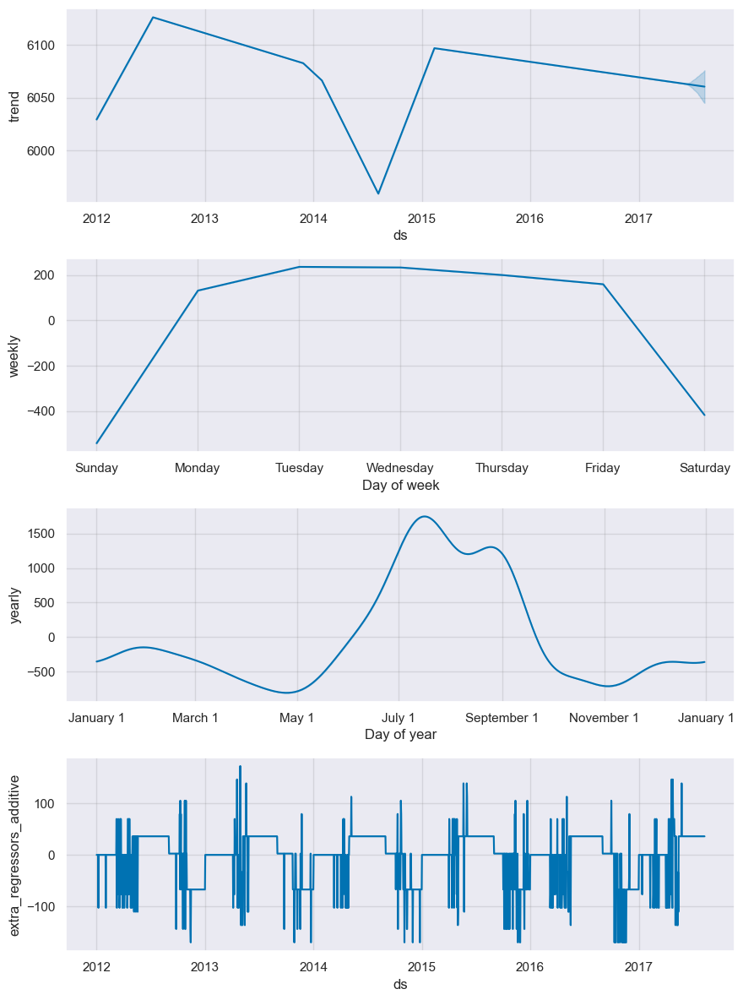

In [58]:
plot_fig_8 = model_3.plot_components(forecast_df_3)

In [59]:
eval_df_3 = pd.merge(train_df, forecast_df_3,on='ds')
eval_df_3  = eval_df_3[['ds','yhat_lower','yhat_upper','yhat','y']]
eval_df_3.head()

,ds,yhat_lower,yhat_upper,yhat,y
0,2012-01-01,4195.470716,6015.936689,5129.448285,4954.833333
1,2012-01-02,4915.651273,6743.598754,5807.654555,5302.954167
2,2012-01-03,4968.531871,6774.094015,5918.635545,6095.512500
3,2012-01-04,5044.708727,6830.625763,5923.180345,6336.266667
4,2012-01-05,5013.699324,6839.260750,5898.047369,6130.245833


In [60]:
y_true = eval_df_3['y'].values
y_pred = eval_df_3['yhat'].values
mae_model_3 = mean_absolute_error(y_true, y_pred)
all_model_MAE.append(mae_model_3)
print('MAE: %.3f' % mae_model_3)

MAE: 318.750


In [61]:
mape_model_3 = mean_absolute_percentage_error(y_true, y_pred)
all_model_MAPE.append(mape_model_3)
print('MAPE: %.3f' % mape_model_3)

MAPE: 0.050


In [62]:
eval_df = pd.DataFrame(columns=['Model Name', 'MAE', 'MAPE'])
eval_df['Model Name']=['Model_1','Model_2','Model_3']
eval_df['MAE']=all_model_MAE
eval_df['MAPE']=all_model_MAPE
eval_df

,Model Name,MAE,MAPE
0,Model_1,321.078357,0.050649
1,Model_2,323.001531,0.050815
2,Model_3,318.750443,0.050218


# Its clear from the table that Model 3 was our best model.

# What if we also add the Holidays?


In [63]:
model_4 = Prophet(interval_width=0.95,yearly_seasonality=True)
model_4.add_regressor('summer_temp',standardize=False)
model_4.add_regressor('summer_temp_min',standardize=False)
model_4.add_regressor('summer_temp_max',standardize=False)
model_4.add_regressor('month_bins',standardize=False,mode='additive')
model_4.add_country_holidays(country_name='US')
model_4.fit(train_df) 
#This code initializes a Prophet model (model_4) and adds several regressors and country-specific holidays for the United States. 

22:56:48 - cmdstanpy - INFO - Chain [1] start processing
22:56:49 - cmdstanpy - INFO - Chain [1] done processing


In [64]:
#Creating forecasts using the trained Prophet model model_5 for future time periods and additional regressors, 
#incorporating country-specific holidays. 
future_df_4 = model_4.make_future_dataframe(periods=test_df.shape[0])
future_df_4['summer_temp'] = df_daily_multi['summer_temp']
future_df_4['summer_temp_min'] = df_daily_multi['summer_temp_min']
future_df_4['summer_temp_max'] = df_daily_multi['summer_temp_max']
future_df_4['month_bins'] = df_daily_multi['month_bins']
forecast_df_4 = model_4.predict(future_df_4) 

In [65]:
plot_fig_11 = plot_plotly(model_4, forecast_df_4)  
py.iplot(plot_fig_11)

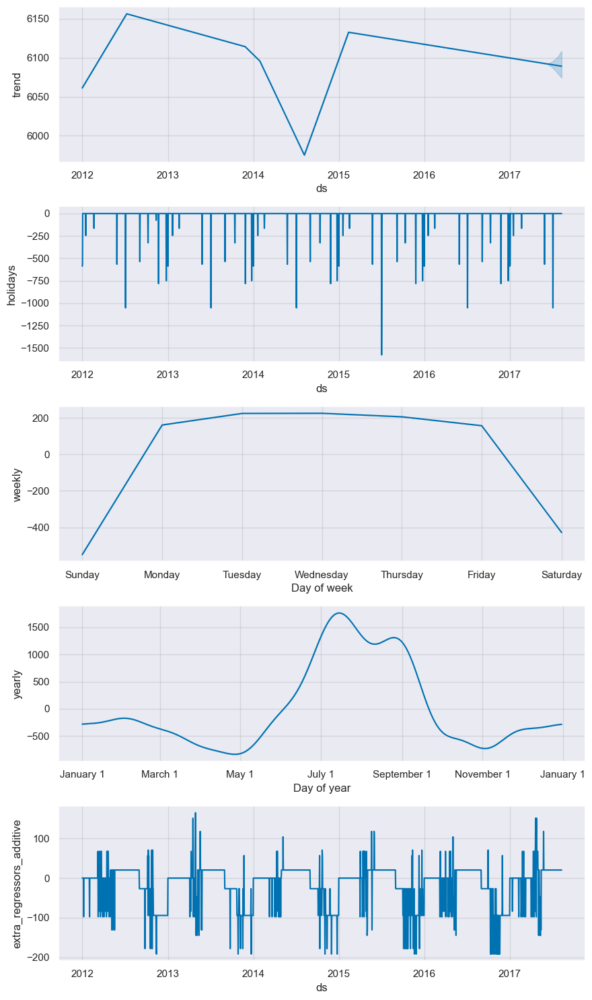

In [66]:
plot_fig_12 = model_4.plot_components(forecast_df_4)

In [67]:
eval_df_4 = pd.merge(train_df, forecast_df_4,on='ds')
eval_df_4  = eval_df_4[['ds','yhat_lower','yhat_upper','yhat','y']]
eval_df_4.head()

,ds,yhat_lower,yhat_upper,yhat,y
0,2012-01-01,3682.737366,5513.122813,4640.639957,4954.833333
1,2012-01-02,4441.045797,6221.687011,5374.953090,5302.954167
2,2012-01-03,5167.747401,6843.585276,6007.509691,6095.512500
3,2012-01-04,5155.996823,6917.116837,6010.688243,6336.266667
4,2012-01-05,5100.082407,6931.895193,5993.626535,6130.245833


In [68]:
y_true = eval_df_4['y'].values
y_pred = eval_df_4['yhat'].values
mae_model_4 = mean_absolute_error(y_true, y_pred)
all_model_MAE.append(mae_model_4)
print('MAE: %.3f' % mae_model_4)

MAE: 312.823


In [69]:
mape_model_4 = mean_absolute_percentage_error(y_true, y_pred)
all_model_MAPE.append(mape_model_4)
print('MAPE: %.3f' % mape_model_4)

MAPE: 0.049


In [70]:
eval_df = pd.DataFrame(columns=['Model Name', 'MAE', 'MAPE'])
eval_df['Model Name']=['Model_1','Model_2','Model_3','Model_4']
eval_df['MAE']=all_model_MAE
eval_df['MAPE']=all_model_MAPE
eval_df

,Model Name,MAE,MAPE
0,Model_1,321.078357,0.050649
1,Model_2,323.001531,0.050815
2,Model_3,318.750443,0.050218
3,Model_4,312.822593,0.049169


# Considering the MAE and MAPE results, we conclude the  best model to be the model 4, which is conisdeirng the holidays in model 3. 
This model analysis showed that the Prophet is quite good for analyzing and forecasting  and provides a pretty accurate values which is also showed by the MAPE. 

# Predict into the Future
We use the best model we trained to build our future dataframe and make predictions.

In [74]:
# Generate future dates for the next year
future_dates = pd.date_range(start='2018-01-01', end='2018-12-31', freq='D')

# Create a DataFrame with future dates
future_df = pd.DataFrame({'ds': future_dates})

In [82]:
# Generate predictions for the future dates
forecast = model_1.predict(future_df)

In [81]:
forecast_hourly = model_1.predict(future_hourly_df)


In [83]:
forecast[['ds','yhat']].head()

,ds,yhat
0,2018-01-01,5783.313702
1,2018-01-02,5901.274458
2,2018-01-03,5910.313203
3,2018-01-04,5886.131997
4,2018-01-05,5856.452935


In [84]:
forecast[['ds','yhat']].tail()

,ds,yhat
360,2018-12-27,5800.011717
361,2018-12-28,5763.959677
362,2018-12-29,5187.464140
363,2018-12-30,5072.368033
364,2018-12-31,5751.207446


In [86]:
import plotly.express as px
forecast['ds'] = pd.to_datetime(forecast['ds'])
forecast['ds']
#Line plot of energy demand over time.
import plotly.express as px
fig_energy = px.line(forecast, x='ds', y='yhat', title='Energy Demand Per Hour (New York)')
fig_energy.update_xaxes(rangeslider_visible=True)
fig_energy.show()


In conclusion, the Prophet time series forecasting models developed in this analysis provide accurate predictions of daily energy demand, leveraging temperature indicators, seasonal variations, and country-specific holidays. These models offer valuable insights for energy planning and resource allocation, aiding in efficient energy management strategies.